In [1]:
import bokeh
from bokeh.plotting import show
import os

import flowkit as fk

bokeh.io.output_notebook()

Loading BokehJS ...

In [2]:
dir_path = "C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025"
dct = {}
for file in os.listdir(dir_path):
    sample = fk.Sample(dir_path+"\\"+file, ignore_offset_error=True)
    sample_df = sample.as_dataframe(source='raw')
    recol = False
    for i in sample_df.columns:
        if len(i) > 1:
            recol = True
            break

    if recol:
        sample_df.columns = [i[0] if len(i[1]) < 1 else i[1] for i in sample_df.columns]
    dct[file] = sample_df

# Интеграция 7 разработанных моделей в один конвейер

In [3]:
from ssca_fsca_model_selector import FlowDBSCANSelector, DBSCANModelManager
# import fsca_fsch_model_selector as fsca_fsch
# import fitca_fsch_model_selector as fitca_fsch

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

In [5]:
from pathlib import Path

## 1. Инициализируем 3 модели для фильтрации по FSC-A/SSC-A и проводим сортировку

In [6]:
ssca_fsca_manager = DBSCANModelManager()
# ssca_fsca_selector = ssca_fsca.FlowDBSCANSelector()
ssca_fsca_manager.add_model("m1", FlowDBSCANSelector.load("models/fsc-a_ssc-a_dbscan_sel_01.joblib"))
ssca_fsca_manager.add_model("m2", FlowDBSCANSelector.load("models/fsc-a_ssc-a_dbscan_sel_02.joblib"))
ssca_fsca_manager.add_model("m3", FlowDBSCANSelector.load("models/fsc-a_ssc-a_dbscan_sel_03.joblib"))
ssca_fsca_manager.add_model("m4", FlowDBSCANSelector.load("models/fsc-a_ssc-a_dbscan_sel_04.joblib"))

folder_ssca_fsca = Path("E:\\parquet")
files_ssca_fsca = list(folder_ssca_fsca.glob("*.parquet"))

summary_ssca_fsca = ssca_fsca_manager.predict_files_with_fallback(
    files_dict=dct,
    # file_paths=files_ssca_fsca,
    model_names=["m1","m2","m3", "m4"],
    x_col="FSC-A",
    y_col="SSC-A",
    out_dir=dir_path,
    min_rows=10_000,
    min_frac=0.6,
)
summary_ssca_fsca

Processing files: 100%|██████████| 280/280 [00:22<00:00, 12.36file/s]


Summary saved to C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\summary.csv


,file,total_rows,selected_rows,frac_selected,used_model
0,EG.5_57-18-K+58-18-7-H_C1.fcs,40000,36710,0.917750,m1
1,EG.5_57-18-K+58-18-7-H_C10.fcs,40000,36214,0.905350,m1
2,EG.5_57-18-K+58-18-7-H_C11.fcs,40000,36870,0.921750,m1
3,EG.5_57-18-K+58-18-7-H_C2.fcs,40000,36485,0.912125,m1
4,EG.5_57-18-K+58-18-7-H_C3.fcs,40000,36847,0.921175,m1
...,...,...,...,...,...
275,XFG_SA55_G5.fcs,38763,35748,0.922220,m1
276,XFG_SA55_G6.fcs,40000,36968,0.924200,m1
277,XFG_SA55_G7.fcs,40000,36395,0.909875,m1
278,XFG_SA55_G8.fcs,39388,36462,0.925713,m1


## Отобразим на примере исходника и обработанного файла

In [7]:
# raw_file = "E:\\parquet\\EG.5_58-Fc_11_d4e54875-ce9a-11f0-8905-f02f74d321c5.parquet"
ssca_fsca_processed_file = dir_path+"\\fsc-a_ssc-a\\EG.5_57-18-K+58-18-7-H_C11_1.parquet"

# raw_df = pd.read_parquet(raw_file)
ssca_fsca_processed_df = pd.read_parquet(ssca_fsca_processed_file)
print("raw_df shape:", dct["EG.5_57-18-K+58-18-7-H_C11.fcs"].shape)
print("ssca_fsca_processed_df shape:", ssca_fsca_processed_df.shape)

raw_df shape: (40000, 7)
ssca_fsca_processed_df shape: (36870, 8)


df1: Оставлено 38921/40000 точек (97.3%) после фильтрации квартилей 0.007–0.99
df2: Оставлено 35926/36870 точек (97.4%) после фильтрации квартилей 0.007–0.99


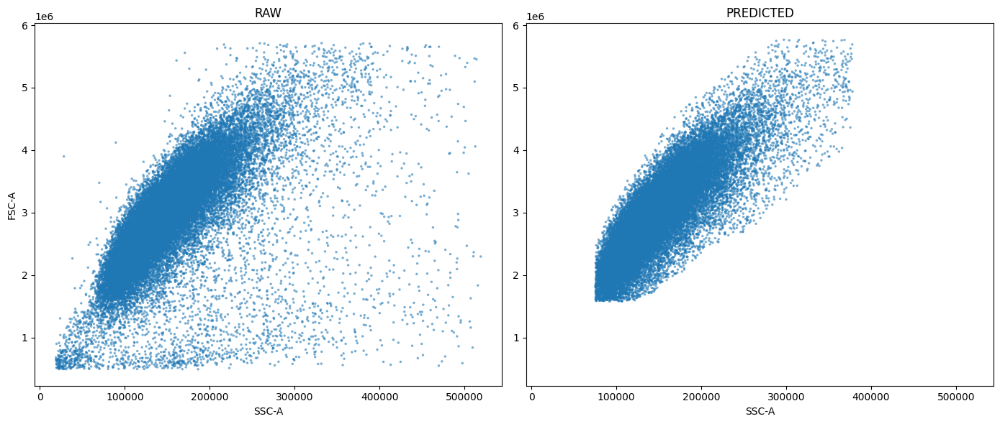

In [8]:
def plot_two_scatter(
    df1,
    df2,
    x_col,
    y_col,
    figsize=(12, 6),
    s=10,
    alpha=0.7,
    titles=None,
    sharexy=False,
    filter_quantiles=False,
    quantile_range=(0.01, 0.99),
    common_axes=True
):
    """
    Построить 2 scatter-плота (side-by-side) для df1 и df2
    без раскраски по меткам.

    Параметры:
      df1, df2        - pandas.DataFrame
      x_col, y_col    - имена колонок с координатами
      figsize         - размер фигуры (width, height)
      s               - размер маркера
      alpha           - прозрачность маркера
      titles          - None или tuple (title_left, title_right)
      sharexy         - если True — sharex и sharey между осями
      filter_quantiles - если True, фильтрация по квантилям
      quantile_range  - (нижний_квантиль, верхний_квантиль)
      common_axes     - если True, одинаковые пределы осей
    """

    # проверки
    for df, name in ((df1, "df1"), (df2, "df2")):
        if not isinstance(df, pd.DataFrame):
            raise TypeError(f"{name} должен быть pandas.DataFrame")
        for col in (x_col, y_col):
            if col not in df.columns:
                raise ValueError(f"Колонка '{col}' не найдена в {name}")

    # Фильтрация по квантилям
    if filter_quantiles:
        for df, name in ((df1, "df1"), (df2, "df2")):
            x_lower = df[x_col].quantile(quantile_range[0])
            x_upper = df[x_col].quantile(quantile_range[1])
            y_lower = df[y_col].quantile(quantile_range[0])
            y_upper = df[y_col].quantile(quantile_range[1])

            mask = (
                (df[x_col] >= x_lower) & (df[x_col] <= x_upper) &
                (df[y_col] >= y_lower) & (df[y_col] <= y_upper)
            )

            kept = mask.sum()
            total = len(mask)
            pct = (kept / total * 100) if total > 0 else 0.0

            print(
                f"{name}: Оставлено {kept}/{total} точек "
                f"({pct:.1f}%) после фильтрации квартилей "
                f"{quantile_range[0]}–{quantile_range[1]}"
            )

            if name == "df1":
                df1 = df.loc[mask].copy()
            else:
                df2 = df.loc[mask].copy()

    # helper: получить данные без NaN
    def _prepare(df):
        mask = df[x_col].notnull() & df[y_col].notnull()
        return df.loc[mask, x_col].to_numpy(), df.loc[mask, y_col].to_numpy()

    x1, y1 = _prepare(df1)
    x2, y2 = _prepare(df2)

    # helper: общие пределы осей
    def _get_common_limits(a, b):
        all_data = np.concatenate([a, b])
        if len(all_data) == 0:
            return 0, 1
        min_val = np.min(all_data)
        max_val = np.max(all_data)
        padding = (max_val - min_val) * 0.05
        if padding == 0:
            padding = 0.01 * abs(min_val) if min_val != 0 else 0.5
        return min_val - padding, max_val + padding

    # фигура
    if sharexy:
        fig, axes = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)
    else:
        fig, axes = plt.subplots(1, 2, figsize=figsize)

    # левый scatter
    axes[0].scatter(x1, y1, s=s, alpha=alpha, edgecolors='none')
    axes[0].set_xlabel(x_col)
    axes[0].set_ylabel(y_col)
    axes[0].set_title(titles[0] if titles and len(titles) > 0 else "Dataset 1")

    # правый scatter
    axes[1].scatter(x2, y2, s=s, alpha=alpha, edgecolors='none')
    axes[1].set_xlabel(x_col)
    axes[1].set_title(titles[1] if titles and len(titles) > 1 else "Dataset 2")

    # общие оси
    if common_axes:
        x_min, x_max = _get_common_limits(x1, x2)
        y_min, y_max = _get_common_limits(y1, y2)

        for ax in axes:
            ax.set_xlim(x_min, x_max)
            ax.set_ylim(y_min, y_max)

    plt.tight_layout()
    return fig, axes

# Пример использования с общими осями
fig, axes = plot_two_scatter(
    dct["EG.5_57-18-K+58-18-7-H_C11.fcs"],
    ssca_fsca_processed_df,
    x_col='SSC-A',
    y_col='FSC-A',
    titles=("RAW", "PREDICTED"),
    figsize=(14, 6),
    s=6,
    alpha=0.6,
    filter_quantiles=True,
    quantile_range=(0.007, 0.99),
    common_axes=True
)
plt.show()

## Добавляем фильтр по FSC-A/FSC-H

In [9]:
from fsca_fsch_model_selector import DBSCANModelManager, FlowDBSCANSelector

In [10]:
manager = DBSCANModelManager()
manager.add_model("m1", FlowDBSCANSelector.load("models/fsc-h_fsc-a_dbscan_sel_01.joblib"))
manager.add_model("m2", FlowDBSCANSelector.load("models/fsc-h_fsc-a_dbscan_sel_02.joblib"))
# manager.add_model("m3", FlowDBSCANSelector.load("models/fsc-a_ssc-a_dbscan_sel_03.joblib"))

folder = Path("C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fsc-a_ssc-a")
files = list(folder.glob("*.parquet"))

summary = manager.predict_files_with_fallback(
    file_paths=files,
    model_names=["m1", "m2"],
    x_col="FSC-H",
    y_col="FSC-A",
    out_dir="C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fsc-h_fsc-a",
    min_rows=10_000,
    min_frac=0.7,
)
summary

Processing files: 100%|██████████| 280/280 [00:23<00:00, 11.99file/s]


Summary saved to C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\fsc-h_fsc-a\summary.csv


,file,total_rows,selected_rows,frac_selected,used_model
0,C:\Users\Professional\Documents\VirusNeutr\VN_...,36214,33694,0.930414,m1
1,C:\Users\Professional\Documents\VirusNeutr\VN_...,36870,34562,0.937402,m1
2,C:\Users\Professional\Documents\VirusNeutr\VN_...,36710,34678,0.944647,m1
3,C:\Users\Professional\Documents\VirusNeutr\VN_...,36485,34282,0.939619,m1
4,C:\Users\Professional\Documents\VirusNeutr\VN_...,36847,34390,0.933319,m1
...,...,...,...,...,...
275,C:\Users\Professional\Documents\VirusNeutr\VN_...,35748,32588,0.911603,m1
276,C:\Users\Professional\Documents\VirusNeutr\VN_...,36968,33939,0.918064,m1
277,C:\Users\Professional\Documents\VirusNeutr\VN_...,36395,33858,0.930293,m1
278,C:\Users\Professional\Documents\VirusNeutr\VN_...,36462,33848,0.928309,m1


In [11]:
raw_file = "C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fsc-a_ssc-a\\JN.1_57-18-7-K+58-18-7-H_G11_1.parquet"
ssca_fsca_processed_file = "C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fsc-h_fsc-a\\JN.1_57-18-7-K+58-18-7-H_G11_1_2.parquet"

raw_df = pd.read_parquet(raw_file)
ssca_fsca_processed_df = pd.read_parquet(ssca_fsca_processed_file)
print("raw_df shape:", raw_df.shape)
print("ssca_fsca_processed_df shape:", ssca_fsca_processed_df.shape)

raw_df shape: (37091, 8)
ssca_fsca_processed_df shape: (35354, 8)


df1: Оставлено 36230/37091 точек (97.7%) после фильтрации квартилей 0.007–0.99
df2: Оставлено 34525/35354 точек (97.7%) после фильтрации квартилей 0.007–0.99


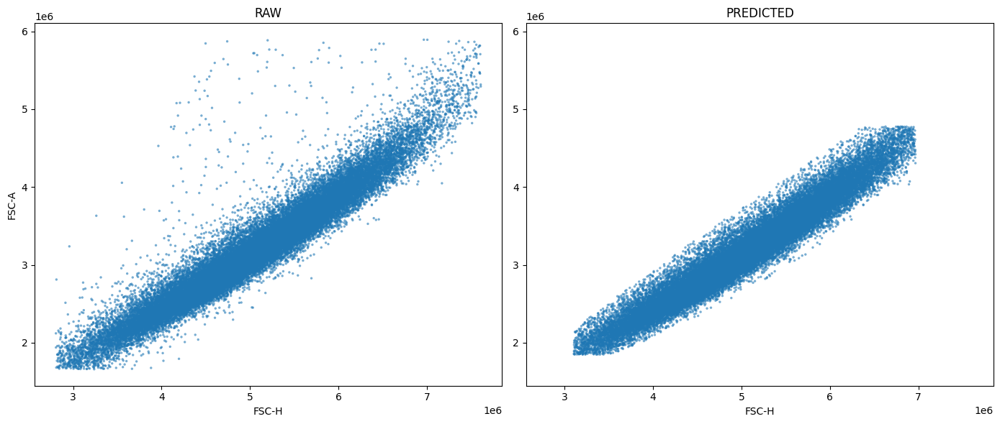

In [12]:
# Пример использования с общими осями
fig, axes = plot_two_scatter(
    raw_df, 
    ssca_fsca_processed_df, 
    x_col='FSC-H', 
    y_col='FSC-A',
    # label_col='label',
    titles=("RAW", "PREDICTED"),
    figsize=(14,6),
    # cmap_name='flag', 
    s=6, 
    alpha=0.6,
    sharexy=False,
    filter_quantiles=True,
    quantile_range=(0.007, 0.99),
    common_axes=True  # Включаем одинаковые оси для обоих графиков
)
plt.show()

# 3. Интегрируем в конвейер предсказание процента инфекционности

In [13]:
from fitca_fsch_model_selector import FlowGMMSelector1D

In [14]:
# использовать 2 модели из файлов (каждый файл — joblib c экземпляром FlowGMMSelector1D)
model_paths = [
    "models/fitc-a_fsc-h_gmm_selector_1.joblib",
    "models/fitc-a_fsc-h_gmm_selector_2.joblib"
]
# обработать папку с переключением моделей
# gmm_selector.process_folder("data/in_dir", out_dir="out_gmm", model_paths=model_paths, threshold_pct=35.0)
gmm_selector = FlowGMMSelector1D()

# только метки
summary = gmm_selector.process_and_visualize_files(
    in_dir="C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fsc-h_fsc-a",
    out_dir="C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025\\fitc-a_fsc-h",
    x_col="FITC-A", 
    model_paths=model_paths, 
    threshold_pct=35.0,
    visualize=False,
    )

summary

[1/281] Processing: EG.5_57-18-K+58-18-7-H_C10_1_2.parquet
    Model 0: infectivity_percent = 9.16%
[2/281] Processing: EG.5_57-18-K+58-18-7-H_C11_1_2.parquet
    Model 0: infectivity_percent = 10.12%
[3/281] Processing: EG.5_57-18-K+58-18-7-H_C1_1_2.parquet
    Model 0: infectivity_percent = 0.65%
[4/281] Processing: EG.5_57-18-K+58-18-7-H_C2_1_2.parquet
    Model 0: infectivity_percent = 0.60%
[5/281] Processing: EG.5_57-18-K+58-18-7-H_C3_1_2.parquet
    Model 0: infectivity_percent = 0.79%
[6/281] Processing: EG.5_57-18-K+58-18-7-H_C4_1_2.parquet
    Model 0: infectivity_percent = 0.88%
[7/281] Processing: EG.5_57-18-K+58-18-7-H_C5_1_2.parquet
    Model 0: infectivity_percent = 3.22%
[8/281] Processing: EG.5_57-18-K+58-18-7-H_C6_1_2.parquet
    Model 0: infectivity_percent = 8.82%
[9/281] Processing: EG.5_57-18-K+58-18-7-H_C7_1_2.parquet
    Model 0: infectivity_percent = 8.21%
[10/281] Processing: EG.5_57-18-K+58-18-7-H_C8_1_2.parquet
    Model 0: infectivity_percent = 9.51%
[11/28

,file,rows,selected,infectivity_percent,model_used,model_path,comp_0_count,comp_0_pct,comp_1_count,comp_1_pct
0,C:\Users\Professional\Documents\VirusNeutr\VN_...,33694,3088,9.164836,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,30604.0,90.834619,3088.0,9.165381
1,C:\Users\Professional\Documents\VirusNeutr\VN_...,34562,3498,10.120942,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,31057.0,89.877008,3498.0,10.122992
2,C:\Users\Professional\Documents\VirusNeutr\VN_...,34678,227,0.654594,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,34450.0,99.345387,227.0,0.654613
3,C:\Users\Professional\Documents\VirusNeutr\VN_...,34282,206,0.600898,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,34073.0,99.399049,206.0,0.600951
4,C:\Users\Professional\Documents\VirusNeutr\VN_...,34390,273,0.793835,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,34114.0,99.206095,273.0,0.793905
...,...,...,...,...,...,...,...,...,...,...
276,C:\Users\Professional\Documents\VirusNeutr\VN_...,32588,1677,5.146066,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,30910.0,94.853776,1677.0,5.146224
277,C:\Users\Professional\Documents\VirusNeutr\VN_...,33939,2353,6.933027,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,31586.0,93.066973,2353.0,6.933027
278,C:\Users\Professional\Documents\VirusNeutr\VN_...,33858,2805,8.284600,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,31052.0,91.715155,2805.0,8.284845
279,C:\Users\Professional\Documents\VirusNeutr\VN_...,33848,3073,9.078823,0,models/fitc-a_fsc-h_gmm_selector_1.joblib,30774.0,90.920909,3073.0,9.079091


In [ ]:
for i, row in summary.iterrows():
    base = row["file"].split("\\")[-1]
    if len(base) > 23:
        base_splited = base.split("_")
        virus = base_splited[0]
        ab = base_splited[1]
        cell = base_splited[2]
        print(base)
    # print(row["file"].split("\\")[-1], row["infectivity_percent"])

EG.5_57-18-K+58-18-7-H_C10_1_2.parquet
EG.5_57-18-K+58-18-7-H_C11_1_2.parquet
EG.5_57-18-K+58-18-7-H_C1_1_2.parquet
EG.5_57-18-K+58-18-7-H_C2_1_2.parquet
EG.5_57-18-K+58-18-7-H_C3_1_2.parquet
EG.5_57-18-K+58-18-7-H_C4_1_2.parquet
EG.5_57-18-K+58-18-7-H_C5_1_2.parquet
EG.5_57-18-K+58-18-7-H_C6_1_2.parquet
EG.5_57-18-K+58-18-7-H_C7_1_2.parquet
EG.5_57-18-K+58-18-7-H_C8_1_2.parquet
EG.5_57-18-K+58-18-7-H_C9_1_2.parquet
EG.5_57-35-7-Fc_B10_1_2.parquet
EG.5_57-35-7-Fc_B11_1_2.parquet
EG.5_57-35-7-Fc_B1_1_2.parquet
EG.5_57-35-7-Fc_B2_1_2.parquet
EG.5_57-35-7-Fc_B3_1_2.parquet
EG.5_57-35-7-Fc_B4_1_2.parquet
EG.5_57-35-7-Fc_B5_1_2.parquet
EG.5_57-35-7-Fc_B6_1_2.parquet
EG.5_57-35-7-Fc_B7_1_2.parquet
EG.5_57-35-7-Fc_B8_1_2.parquet
EG.5_57-35-7-Fc_B9_1_2.parquet
EG.5_58-35-H15K_D10_1_2.parquet
EG.5_58-35-H15K_D11_1_2.parquet
EG.5_58-35-H15K_D1_1_2.parquet
EG.5_58-35-H15K_D2_1_2.parquet
EG.5_58-35-H15K_D3_1_2.parquet
EG.5_58-35-H15K_D4_1_2.parquet
EG.5_58-35-H15K_D5_1_2.parquet
EG.5_58-35-H15K_D6

In [40]:
import re
from pathlib import Path
import pandas as pd

def parse_from_summary(summary: pd.DataFrame) -> pd.DataFrame:
    """
    Из summary['file'] извлекает:
      virus, ab, cell, cell_letter, cell_num
    Возвращает новый DataFrame с добавленными колонками.
    """

    def _parse(path: str):
        base = Path(path).name
        stem = base.rsplit(".", 1)[0]
        parts = stem.split("_")

        virus = parts[0] if len(parts) > 0 else None
        ab = parts[1] if len(parts) > 1 else None
        cell = parts[2] if len(parts) > 2 else None

        cell_letter = None
        cell_num = None
        if cell:
            m = re.search(r'([A-Za-z]+)(\d+)', cell)
            if m:
                cell_letter = m.group(1)
                cell_num = int(m.group(2))

        return pd.Series({
            "virus": virus,
            "ab": ab,
            "cell": cell,
            "cell_letter": cell_letter,
            "cell_num": cell_num
        })

    parsed = summary["file"].apply(_parse)
    result = pd.concat([summary.reset_index(drop=True), parsed], axis=1)[["virus", "ab", "cell", "cell_letter", "cell_num", "infectivity_percent"]].dropna()
    result["cell_num"] = result["cell_num"].astype(int)
    return result
summary_ext = parse_from_summary(summary)

In [50]:
summary_ext[summary_ext["virus"] == "JN.1"]

,virus,ab,cell,cell_letter,cell_num,infectivity_percent
47,JN.1,57-18-7-K+58-18-7-H,G10,G,10,21.219678
48,JN.1,57-18-7-K+58-18-7-H,G11,G,11,24.707247
49,JN.1,57-18-7-K+58-18-7-H,G1,G,1,25.846040
50,JN.1,57-18-7-K+58-18-7-H,G2,G,2,24.987319
51,JN.1,57-18-7-K+58-18-7-H,G3,G,3,24.601399
52,JN.1,57-18-7-K+58-18-7-H,G4,G,4,27.999322
53,JN.1,57-18-7-K+58-18-7-H,G5,G,5,22.405807
54,JN.1,57-18-7-K+58-18-7-H,G6,G,6,20.849041
55,JN.1,57-18-7-K+58-18-7-H,G7,G,7,22.337947
56,JN.1,57-18-7-K+58-18-7-H,G8,G,8,22.823741


In [42]:
dct = {
    "X": [],
}

generate_sequence = lambda x: [x * (1/3)**i for i in range(11)]

dct["X"] = generate_sequence(8000)

for ab in set(summary_ext[summary_ext["ab"] != "X"]["ab"]):
    # infectivity = results_report_copy[results_report_copy["ab"] == ab].sort_values(by='number', ascending=True)["infectivity_percent"].values
    print(ab, list(summary_ext[summary_ext["ab"] == ab].sort_values(by='cell_num', ascending=True)["infectivity_percent"].values))
    if len(list(summary_ext[summary_ext["ab"] == ab].sort_values(by='cell_num', ascending=True)["infectivity_percent"].values)) < 11:
        continue
    dct[ab] = list(summary_ext[summary_ext["ab"] == ab].sort_values(by='cell_num', ascending=True)["infectivity_percent"].values)
    
df = pd.DataFrame(dct)
df

A57+B58 [11.773333709418102, 1.4591069914324981, 2.0040307701041757, 28.91658735762748, 1.780758556891767, 2.4588321249929748, 11.847268769155853, 24.875932280293792, 2.4797047970479706, 2.937932984589283, 13.825784772681581, 25.47308365813704, 6.829998869673336, 32.441443223236234, 5.467888843766317, 20.690464318188486, 27.950916023968578, 24.107805630103353, 19.050322141174465, 7.834602829162133, 27.91664261386596, 19.410326395996815, 23.258981781031842, 8.964276386430251, 24.850697687583143, 31.698330454807138, 8.990226129200162, 19.54414015989114, 27.587876716230845, 18.74252520075175, 24.293178929529727, 10.08198151055294, 17.629411598222624, 27.595745287592322, 25.287550744248986, 10.495929796201143, 23.35591306802145, 20.750608066067084, 28.48595361559063, 9.688127893771293, 28.01185083895963, 21.806783202959533, 22.751625934733404, 10.909248956884563]
57-18-K+58-18-7-H [0.6545936905242516, 0.6008984306633218, 0.7938354172724629, 0.8844391254852739, 3.2231380542999792, 8.8160111

ValueError: All arrays must be of the same length

In [44]:
virus_groups = {
    virus: df_virus.copy()
    for virus, df_virus in summary_ext.groupby("virus")
}

def build_virus_matrix(
    df_virus: pd.DataFrame,
    start_conc=8000,
    dilutions=11
):
    dct = {}

    # X — концентрации
    dct["X"] = [start_conc * (1/3)**i for i in range(dilutions)]

    # перебираем антитела
    for ab in sorted(df_virus["ab"].unique()):
        values = (
            df_virus[df_virus["ab"] == ab]
            .set_index("cell_num")                    # ключ — номер ячейки
            .reindex(range(1, dilutions + 1))         # гарантируем 1..11
            ["infectivity_percent"]
            .fillna(0.0)                              # отсутствующие → 0
            .values
            .tolist()
        )

        dct[ab] = values

    return pd.DataFrame(dct)

virus_dfs = {}

for virus, df_virus in virus_groups.items():
    virus_dfs[virus] = build_virus_matrix(df_virus)

In [49]:
virus_dfs["JN.1"]

,X,57-18-7-K+58-18-7-H,57-35-7-Fc,58-35-H15K,A57+B58
0,8000.000000,25.846040,27.353125,24.817975,28.916587
1,2666.666667,24.987319,21.755747,23.059560,24.875932
2,888.888889,24.601399,23.455251,26.408035,25.473084
3,296.296296,27.999322,26.405221,25.801246,32.441443
4,98.765432,22.405807,23.122069,24.314421,24.107806
5,32.921811,20.849041,20.343929,23.980019,19.410326
6,10.973937,22.337947,22.926967,25.236008,19.544140
7,3.657979,22.823741,20.898365,23.871671,18.742525
8,1.219326,20.475263,18.723717,23.709058,17.629412
9,0.406442,21.219678,21.508077,23.074547,20.750608


In [48]:
BASE_DIR = Path(r"C:\\Users\\Professional\\Documents\\VirusNeutr\\VN_19.12.2025")
DATE_STR = "19.12.2025"

for virus, df in virus_dfs.items():
    out_path = BASE_DIR / f"BsAb_{virus}_{DATE_STR}.xlsx"
    df.to_excel(out_path, index=False)

    print(f"Saved: {out_path}")

Saved: C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\BsAb_EG.5_19.12.2025.xlsx
Saved: C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\BsAb_JN.1_19.12.2025.xlsx
Saved: C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\BsAb_KP.2_19.12.2025.xlsx
Saved: C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\BsAb_XEC_19.12.2025.xlsx
Saved: C:\Users\Professional\Documents\VirusNeutr\VN_19.12.2025\BsAb_XFG_19.12.2025.xlsx


# Теперь давайте визуализируем результаты предсказаний

In [15]:
from typing import Tuple, Optional, Sequence
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D


def _filter_by_quantiles(df: pd.DataFrame, cols: Sequence[str], low_q: float = 0.01, high_q: float = 0.99) -> pd.DataFrame:
    for c in cols:
        if c not in df.columns:
            raise KeyError(f"Column '{c}' not found in dataframe.")
    mask = pd.Series(True, index=df.index)
    for c in cols:
        lo = df[c].quantile(low_q)
        hi = df[c].quantile(high_q)
        mask &= df[c].between(lo, hi)
    return df.loc[mask].copy()


def plot_processing_stages(
    file1: str,
    file2: str,
    file3: str,
    file4: str,
    save_path: Optional[str] = None,
    show: bool = True,
    scatter_s: int = 2,
    alpha: float = 0.6
) -> Tuple[plt.Figure, Sequence[plt.Axes]]:
    # загрузка
    df1 = pd.read_parquet(file1)
    df2 = pd.read_parquet(file2)
    df3 = pd.read_parquet(file3)
    df4 = pd.read_parquet(file4)

    # filtering
    df1f = _filter_by_quantiles(df1, ("FSC-A", "SSC-A"))
    df2f = _filter_by_quantiles(df2, ("FSC-A", "SSC-A"))
    df3f = _filter_by_quantiles(df3, ("FSC-H", "FSC-A"))
    df4f = _filter_by_quantiles(df4, ("FITC-A", "FSC-H"))

    # sizes
    n1, n2, n3, n4 = len(df1f), len(df2f), len(df3f), len(df4f)
    pct_2_of_1 = n2 / n1 * 100 if n1 else 0
    pct_3_of_2 = n3 / n2 * 100 if n2 else 0

    # infection rates
    if "label" not in df4f.columns:
        raise KeyError("Column 'label' not found in file4.")
    if "gmm_right" not in df4f.columns:
        raise KeyError("Column 'gmm_right' not found in file4.")

    pct_label1 = df4f["label"].mean() * 100
    pct_gmm1 = df4f["gmm_right"].mean() * 100

    # figure: now 4 plots in a row
    fig, axes = plt.subplots(1, 4, figsize=(25, 5), constrained_layout=True)

    # ----------------------------------------------------------
    # PLOT 1 — file1 + file2
    # ----------------------------------------------------------
    ax = axes[0]
    ax.scatter(df1f["FSC-A"], df1f["SSC-A"], s=scatter_s, alpha=alpha, color="blue", label="File1")
    ax.scatter(df2f["FSC-A"], df2f["SSC-A"], s=scatter_s, alpha=alpha, color="red", label=f"File2 ({pct_2_of_1:.1f}%)")
    ax.set_xlabel("FSC-A")
    ax.set_ylabel("SSC-A")
    ax.set_title("Raw vs Stage 2")
    ax.legend(loc="upper right", frameon=True)

    # ----------------------------------------------------------
    # PLOT 2 — file2 + file3
    # ----------------------------------------------------------
    ax = axes[1]
    ax.scatter(df2f["FSC-A"], df2f["FSC-H"], s=scatter_s, alpha=alpha, color="blue", label="File2")
    ax.scatter(df3f["FSC-A"], df3f["FSC-H"], s=scatter_s, alpha=alpha, color="red", label=f"File3 ({pct_3_of_2:.1f}%)")
    ax.set_xlabel("FSC-A")
    ax.set_ylabel("FSC-H")
    ax.set_title("Stage 2 vs Stage 3")
    ax.legend(loc="upper right", frameon=True)

    # ----------------------------------------------------------
    # PLOT 3 — label (manual)
    # ----------------------------------------------------------
    ax = axes[2]
    x_val = biexp_transform(df4f["FITC-A"])
    y_val = df4f["FSC-H"]

    colors_label = np.where(df4f["label"] == 1, "red", "blue")

    ax.scatter(x_val, y_val, c=colors_label, s=scatter_s, alpha=alpha)
    ax.set_xlabel("FITC-A (biex)")
    ax.set_ylabel("FSC-H")
    ax.set_title("Processed manually")
    handles = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='label=0'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label=f"label=1 ({pct_label1:.1f}%)"),
    ]
    ax.legend(handles=handles, loc="upper right", frameon=True)

    # ----------------------------------------------------------
    # PLOT 4 — gmm_right (AI)
    # ----------------------------------------------------------
    ax = axes[3]
    x_val = biexp_transform(df4f["FITC-A"])
    y_val = df4f["FSC-H"]

    colors_gmm = np.where(df4f["gmm_right"] == 1, "red", "blue")

    ax.scatter(x_val, y_val, c=colors_gmm, s=scatter_s, alpha=alpha)
    ax.set_xlabel("FITC-A (biex)")
    ax.set_ylabel("FSC-H")
    ax.set_title("Processed by AI")
    handles2 = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='gmm_right=0'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label=f"gmm_right=1 ({pct_gmm1:.1f}%)"),
    ]
    ax.legend(handles=handles2, loc="upper right", frameon=True)

    fig.suptitle("Processing overview", fontsize=16)

    if save_path:
        fig.savefig(save_path, dpi=300)
    if show:
        plt.show()

    return fig, axes

def biexp_transform(x, cofactor=150):
    return np.arcsinh(x / cofactor)


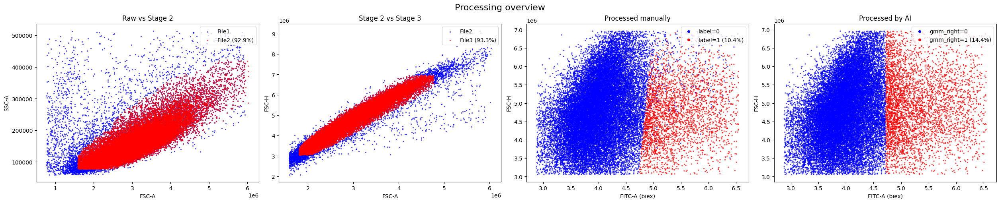

In [16]:
fig, axes = plot_processing_stages(
    "E:/parquet/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5.parquet",
    "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1.parquet",
    "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1_2.parquet",
    "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1_2_gmm.parquet",
    save_path="result_plots/NB.1.8.1_57-35-7-Fc_F11_processing_overview.png",
    show=True
)

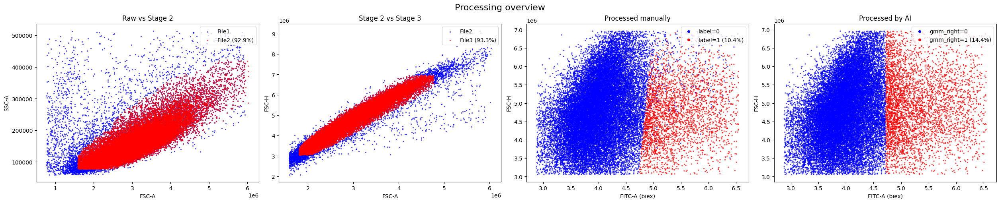

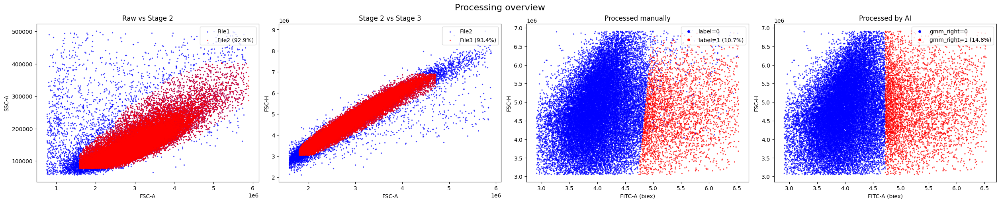

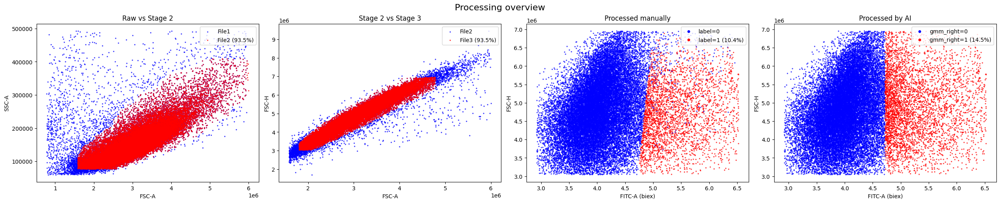

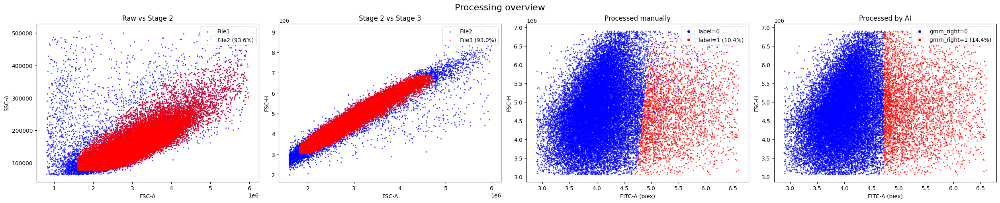

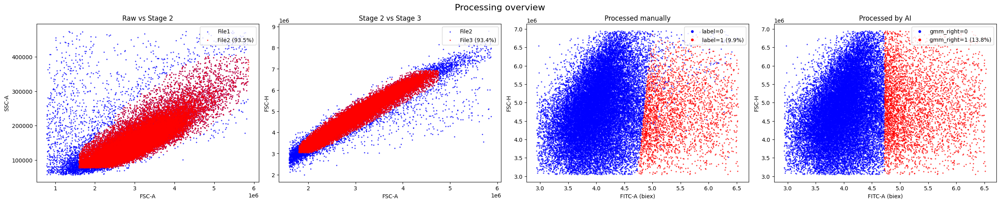

...

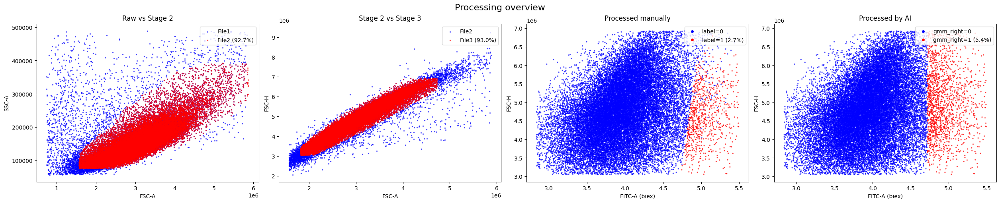

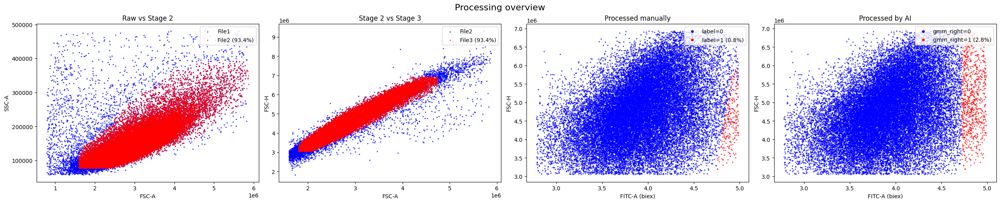

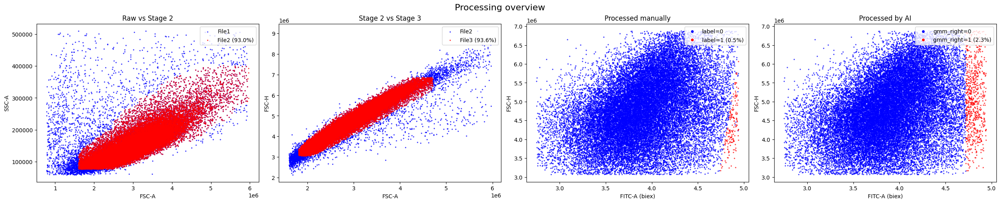

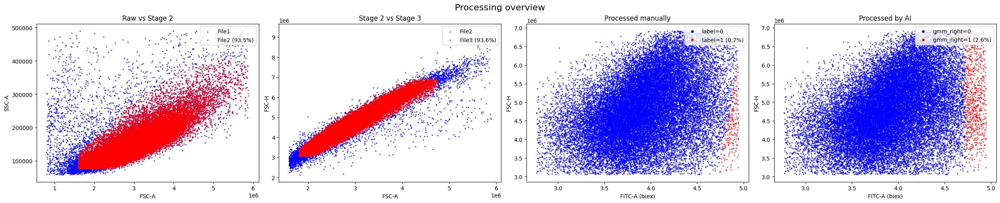

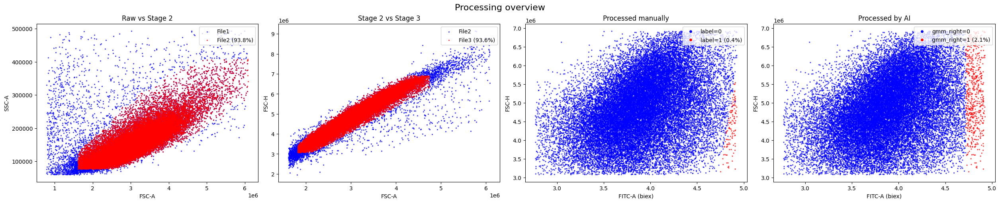

In [20]:
nb181_files = [
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F11_d0ef7fad-ce99-11f0-a3ea-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F10_d0cbf00a-ce99-11f0-9bff-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F10_d0cbf00a-ce99-11f0-9bff-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F10_d0cbf00a-ce99-11f0-9bff-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F10_d0cbf00a-ce99-11f0-9bff-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F9_d263aca1-ce99-11f0-99f7-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F9_d263aca1-ce99-11f0-99f7-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F9_d263aca1-ce99-11f0-99f7-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F9_d263aca1-ce99-11f0-99f7-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F8_d2435002-ce99-11f0-8cd9-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F8_d2435002-ce99-11f0-8cd9-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F8_d2435002-ce99-11f0-8cd9-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F8_d2435002-ce99-11f0-8cd9-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F7_d2256a30-ce99-11f0-a520-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F7_d2256a30-ce99-11f0-a520-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F7_d2256a30-ce99-11f0-a520-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F7_d2256a30-ce99-11f0-a520-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F6_d2055c58-ce99-11f0-8df8-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F6_d2055c58-ce99-11f0-8df8-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F6_d2055c58-ce99-11f0-8df8-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F6_d2055c58-ce99-11f0-8df8-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F5_d1e75f06-ce99-11f0-aa63-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F5_d1e75f06-ce99-11f0-aa63-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F5_d1e75f06-ce99-11f0-aa63-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F5_d1e75f06-ce99-11f0-aa63-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F4_d1abbb57-ce99-11f0-bdc2-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F4_d1abbb57-ce99-11f0-bdc2-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F4_d1abbb57-ce99-11f0-bdc2-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F4_d1abbb57-ce99-11f0-bdc2-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F3_d16fc25b-ce99-11f0-8f0f-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F3_d16fc25b-ce99-11f0-8f0f-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F3_d16fc25b-ce99-11f0-8f0f-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F3_d16fc25b-ce99-11f0-8f0f-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F2_d132dc19-ce99-11f0-9953-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F2_d132dc19-ce99-11f0-9953-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F2_d132dc19-ce99-11f0-9953-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F2_d132dc19-ce99-11f0-9953-f02f74d321c5_1_2_gmm.parquet",
    },
    {
        "raw": "E:/parquet/NB.1.8.1_57-35-7-Fc_F1_d0a3cc20-ce99-11f0-81b2-f02f74d321c5.parquet",
        "fsc-a/ssc-a": "E:/parquet/parsed_data/fsc-a_ssc-a/NB.1.8.1_57-35-7-Fc_F1_d0a3cc20-ce99-11f0-81b2-f02f74d321c5_1.parquet",
        "fsc-h/fsc-a": "E:/parquet/parsed_data/fsc-h_fsc-a/NB.1.8.1_57-35-7-Fc_F1_d0a3cc20-ce99-11f0-81b2-f02f74d321c5_1_2.parquet",
        "fitc-a/fsc-h": "E:/parquet/parsed_data/fitc-a_fsc-h/NB.1.8.1_57-35-7-Fc_F1_d0a3cc20-ce99-11f0-81b2-f02f74d321c5_1_2_gmm.parquet",
    },
]

i = 11
for file in nb181_files:
    fig, axes = plot_processing_stages(
        file['raw'],
        file['fsc-a/ssc-a'],
        file['fsc-h/fsc-a'],
        file['fitc-a/fsc-h'],
        save_path=f"result_plots/NB.1.8.1_57-35-7-Fc_F{i}_processing_overview.png",
        show=True
    )
    i -= 1